<a href="https://colab.research.google.com/github/OmerElshrief/Image-Panorama-stiching/blob/master/Image_Panorama_stiching.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [44]:
pip install opencv-contrib-python==3.4.2.16


In [0]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import imageio
import imutils
cv2.ocl.setUseOpenCL(False)

In [0]:
def load_images(img1_url, img2_url):
  img1 = imageio.imread(img1_url)
  img1_gray = cv2.cvtColor(img1, cv2.COLOR_RGB2GRAY)

  img2 = imageio.imread(img2_url)
  img2_gray = cv2.cvtColor(img2, cv2.COLOR_RGB2GRAY)

  fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, constrained_layout=False, figsize=(16,9))
  ax1.imshow(img2, cmap="gray")
  ax1.set_xlabel("Image1")

  ax2.imshow(img1, cmap="gray")
  ax2.set_xlabel("Image2")
  plt.show()
  return img1,img1_gray,img2,img2_gray

# Step 1: Getting correspondences 
Since we were not provided with a code as mentinoed in the PDF, We shall use the automatic feature extractor (SIFT and SURF).
We will start by extracting key points from both images.

In [0]:
def keypoints_extractor(img,method = 'sift'):
  if method == 'sift':
      extractor = cv2.xfeatures2d.SIFT_create()
  elif method == 'surf':
      extractor = cv2.xfeatures2d.SURF_create()
  return extractor.detectAndCompute(img, None)


def plot_keypoints(imgA,keypointsA,imgB,keypointsB,labelA,labelB):
  fig, (ax1,ax2) = plt.subplots(nrows=1, ncols=2, figsize=(20,8), constrained_layout=False)
  ax1.imshow(cv2.drawKeypoints(imgA,keypointsA,None,color=(0,255,0)))
  ax1.set_xlabel("(a)", fontsize=14)
  ax2.imshow(cv2.drawKeypoints(imgB,keypointsB,None,color=(0,255,0)))
  ax2.set_xlabel("(b)", fontsize=14)
  plt.show()
  


# Features matching
since we have a large number of features from both images. Now, we would like to compare the 2 sets of features and stick with the pairs that show more similarity.

In [0]:
def get_matches(img2,img_train_kp,f_train, img1,img_original_kp, f_original):
  # For Feature matching we can use Brute force or KNN
  correspondenceList = []
  feature_mathing_method = 'BF'
  matcher = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
  matches = matcher.match(f_train, f_original)
  print("got ",len(matches)," matches by Brute Force.")
  matches_sorted = sorted(matches, key = lambda x:x.distance)
  plot = cv2.drawMatches( img2, img_train_kp, img1,img_original_kp,matches_sorted[:200], None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
  axis = plt.figure(figsize=(20,8))
  keypoints = [img_train_kp,img_original_kp]
  for match in matches:
            (x1, y1) = keypoints[0][match.queryIdx].pt
            (x2, y2) = keypoints[1][match.trainIdx].pt
            correspondenceList.append([x1, y1, x2, y2])
  plt.imshow(plot)
  corrs = np.matrix(correspondenceList)
  return corrs, matches

# Estimating the Homography
RANSAC solves this problem by estimating parameters only using a subset of inliers in the data.

In [0]:
class Homography():
  def __init__(self,x,y):
    """
    X should be an MxN matrix, where M is number of samples, 
    and N is number of independent variables.
    y should be an mx1 vector of dependent variables.
    """
    self.x = x
    self.y = y 
    self.input_size = x.shape[0]
    

  def estimate_parameters(self,x,y):
    input_size = x.shape[0]
    bias = np.ones((input_size, 1))
    A = np.hstack((x, bias))
    parameters = np.linalg.lstsq(A, y)[0]
    return parameters

  def evaluate_model(self,parameters, min_inliers_dist):

    y = self.y.reshape(self.y.shape[0], 1)
    A = np.hstack((y, self.x, self.bias))
    parameters = np.insert(self.parameters, 0, -1.)
    distances = np.abs(np.sum(A*parameters, axis=1)) / np.sqrt(np.sum(np.power(parameters[:-1], 2)))
    inliers = distances <= min_inliers_dist
    num_inliers = np.count_nonzero(inliers == True)
    
    return num_inliers

    
  def ransac_LSQRT(self,iterations, samples_to_fit=4, inlier_threshold=0.2, min_inliers=10):
    best_perfor = 0
    best_model = None
    

    for i in range(iterations):
      sample = np.random.choice(self.input_size, size=samples_to_fit, replace=False)
      model_param = self.estimate_parameters(self.x[sample], self.y[sample])
      model_perf = self.evaluate_model(model_param,inlier_threshold)

      if model_perf > best_perfor:
        best_model = model_param


    return best_model

  
def calculateHomography(correspondences):
    #loop through correspondences and create assemble matrix
    aList = []
    for corr in correspondences:
        p1 = np.matrix([corr.item(0), corr.item(1), 1])
        p2 = np.matrix([corr.item(2), corr.item(3), 1])

        a2 = [0, 0, 0, -p2.item(2) * p1.item(0), -p2.item(2) * p1.item(1), -p2.item(2) * p1.item(2),
              p2.item(1) * p1.item(0), p2.item(1) * p1.item(1), p2.item(1) * p1.item(2)]
        a1 = [-p2.item(2) * p1.item(0), -p2.item(2) * p1.item(1), -p2.item(2) * p1.item(2), 0, 0, 0,
              p2.item(0) * p1.item(0), p2.item(0) * p1.item(1), p2.item(0) * p1.item(2)]
        aList.append(a1)
        aList.append(a2)

    matrixA = np.matrix(aList)

    #svd composition
    u, s, v = np.linalg.svd(matrixA)

    #reshape the min singular value into a 3 by 3 matrix
    h = np.reshape(v[8], (3, 3))

    #normalize and now we have h
    h = (1/h.item(8)) * h
    return h


#
#Calculate the geometric distance between estimated points and original points
#
def geometricDistance(correspondence, h):

    p1 = np.transpose(np.matrix([correspondence[0].item(0), correspondence[0].item(1), 1]))
    estimatep2 = np.dot(h, p1)
    estimatep2 = (1/estimatep2.item(2))*estimatep2

    p2 = np.transpose(np.matrix([correspondence[0].item(2), correspondence[0].item(3), 1]))
    error = p2 - estimatep2
    return np.linalg.norm(error)

#
# Ordinary Ransac
#
def getHomography(kpsA, kpsB, featuresA, featuresB, matches, reprojThresh):
    # convert the keypoints to numpy arrays
    kpsA = np.float32([kp.pt for kp in kpsA])
    kpsB = np.float32([kp.pt for kp in kpsB])
    
    if len(matches) > 4:

        # construct the two sets of points
        ptsA = np.float32([kpsA[m.queryIdx] for m in matches])
        ptsB = np.float32([kpsB[m.trainIdx] for m in matches])
        
        # estimate the homography between the sets of points
        (H, status) = cv2.findHomography(ptsA, ptsB, cv2.RANSAC, reprojThresh)

        return H, status


#
#Runs through ransac algorithm, creating homographies from random correspondences
#
def ransac_SVD(corr, thresh,iterations):
    maxInliers = []
    finalH = None
    for i in range(iterations):
        #find 4 random points to calculate a homography
        corr1 = corr[random.randrange(0, len(corr))]
        corr2 = corr[random.randrange(0, len(corr))]
        randomFour = np.vstack((corr1, corr2))
        corr3 = corr[random.randrange(0, len(corr))]
        randomFour = np.vstack((randomFour, corr3))
        corr4 = corr[random.randrange(0, len(corr))]
        randomFour = np.vstack((randomFour, corr4))

        #call the homography function on those points
        h = calculateHomography(randomFour)
        inliers = []

        for i in range(len(corr)):
            d = geometricDistance(corr[i], h)
            if d < 5:
                inliers.append(corr[i])

        if len(inliers) > len(maxInliers):
            maxInliers = inliers
            finalH = h

        if len(maxInliers) > (len(corr)*thresh):
            break
    print("Ransac finished.")
    print("Corr size: ", len(corr), "Max inliers: ", len(maxInliers))
    print("Homography matrix has been estimated successfully.")

    return finalH, maxInliers




# Image warpping
Once we have the estimated Homography, we need to warp one of the images to a common plane.
Here, we are going to apply a perspective transformation to one of the images. 

In [0]:
def warp_image(trainImg, queryImg, homography_matrix):
  # Apply panorama correction
  width = trainImg.shape[1] + queryImg.shape[1]
  height = trainImg.shape[0] + queryImg.shape[0]

  result = cv2.warpPerspective(trainImg, homography_matrix, (width, height))
  result[0:queryImg.shape[0], 0:queryImg.shape[1]] = queryImg
  return result

In [0]:
def show_panorama(result):
  
  # transform the panorama image to grayscale and threshold it 
  gray = cv2.cvtColor(result, cv2.COLOR_BGR2GRAY)
  thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY)[1]

  # Finds contours from the binary image
  cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
  cnts = imutils.grab_contours(cnts)

  # get the maximum contour area
  c = max(cnts, key=cv2.contourArea)

  # get a bbox from the contour area
  (x, y, w, h) = cv2.boundingRect(c)

  # crop the image to the bbox coordinates
  result = result[y:y + h, x:x + w]

  # show the cropped image
  plt.figure(figsize=(20,10))
  plt.imshow(result)

In [0]:
def stich_images(img1,img2, ransac = False):
  print('Loading images')
  img1,img1_gray,img2,img2_gray = load_images(img1_url, img2_url)
  print("Extracting keypoints..")
  img_train_kp, f_train = keypoints_extractor(img1_gray)
  img_original_kp, f_original = keypoints_extractor(img2_gray)

  plot_keypoints(img1_gray,img_train_kp, img2_gray,img_original_kp, 'train Image', "query Image")
  print("Getting corresponding points..")
  correspondence_matrix, matches = get_matches(img2,img_train_kp,f_train,img1,img_original_kp, f_original)
  print("Estimating the Homography Matrix using Ransac ...")
  if ransac == False:
    finalH, inliers = ransac_SVD(correspondence_matrix, 0.6,100)
  else:
    
    finalH, inliers = getHomography(img_train_kp,img_original_kp, f_train, f_original,matches, 0.6)


  # print("Final homography: ", finalH)
  print ("Final inliers count: ", len(inliers))
  print("warpping images.. ")
  result = warp_image(img1,img2,finalH)
  print("Building the final Panorama")
  show_panorama(result)



Loading images


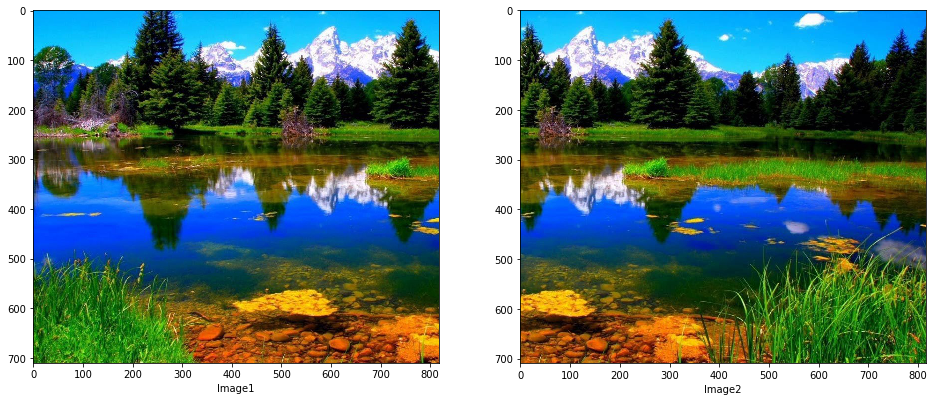

Extracting keypoints..


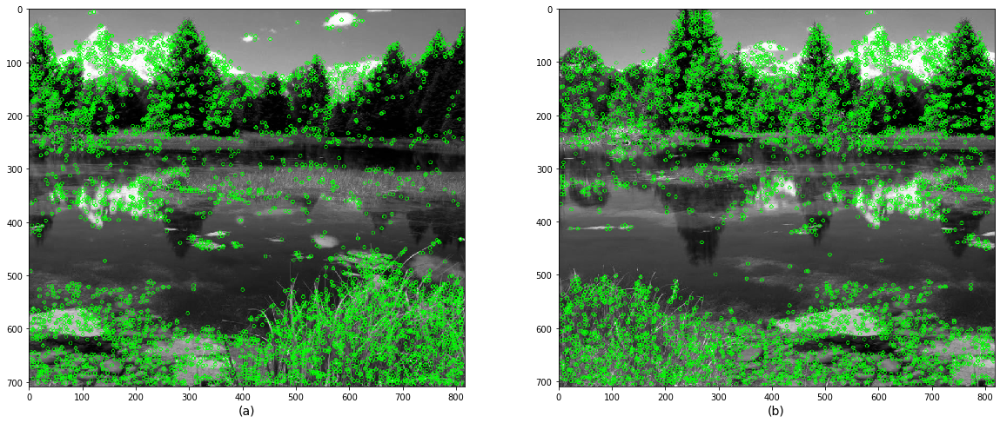

Getting corresponding points..
got  3583  matches by Brute Force.
Estimating the Homography Matrix using Ransac ...
Ransac finished.
Corr size:  3583 Max inliers:  2006
Homography matrix has been estimated successfully.
Final inliers count:  2006
warpping images.. 
Building the final Panorama


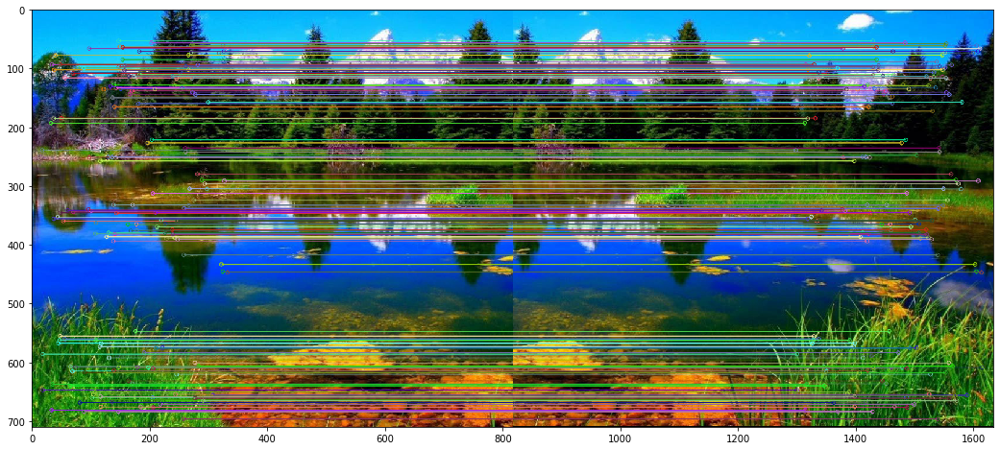

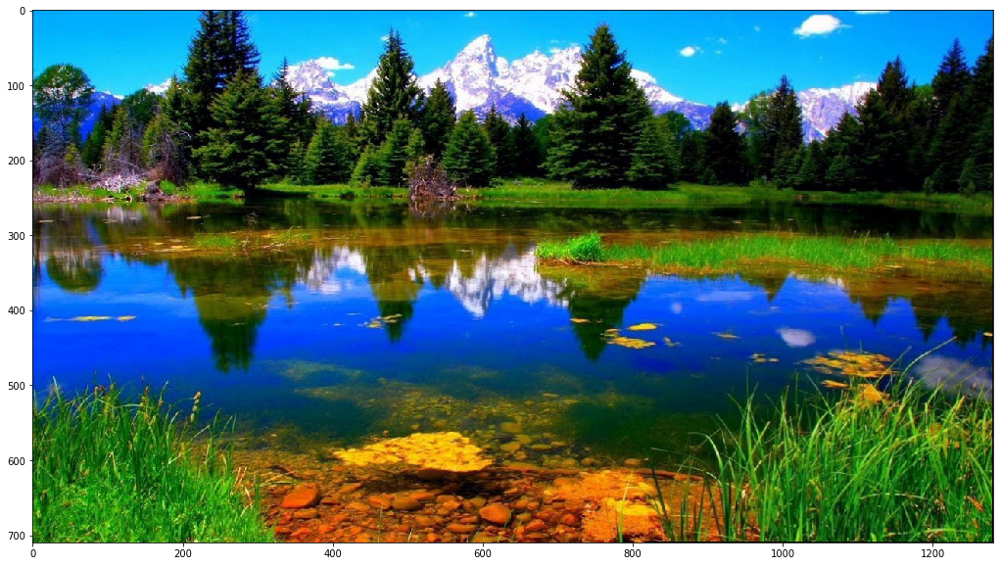

In [94]:
img1_url = "1.jpg"
img2_url = "2.jpg"
stich_images(img2_url,img1_url)


# Example 2

Loading images


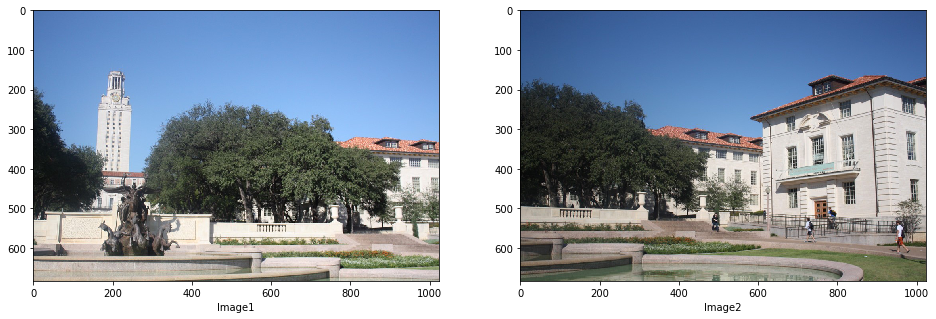

Extracting keypoints..


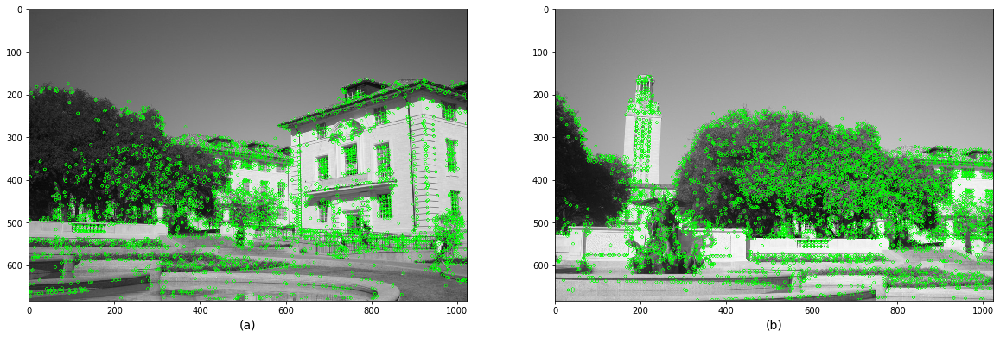

Getting corresponding points..
got  2633  matches by Brute Force.
Estimating the Homography Matrix using Ransac ...
Ransac finished.
Corr size:  2633 Max inliers:  670
Homography matrix has been estimated successfully.
Final inliers count:  670
warpping images.. 
Building the final Panorama


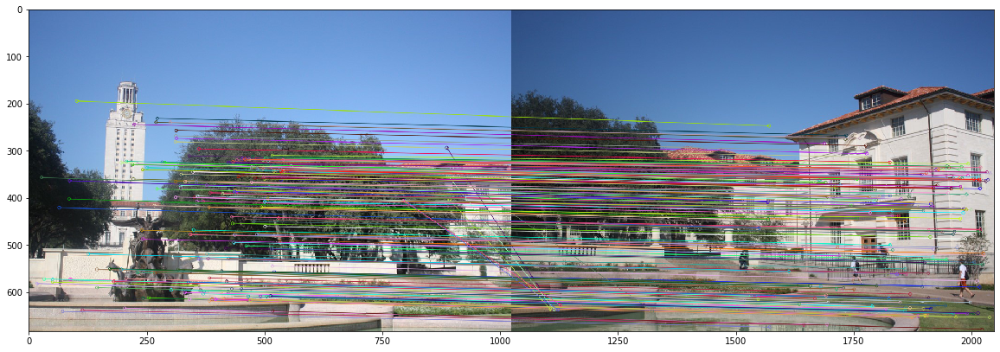

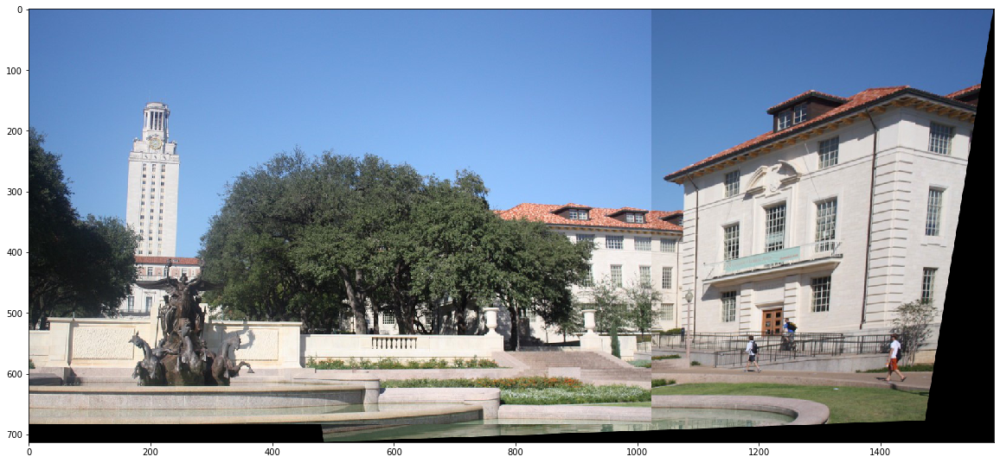

In [98]:
img1_url = "http://www.ic.unicamp.br/~helio/imagens_registro/foto1A.jpg"
img2_url = "http://www.ic.unicamp.br/~helio/imagens_registro/foto1B.jpg"
stich_images(img2_url,img1_url,ransac = False)


Loading images


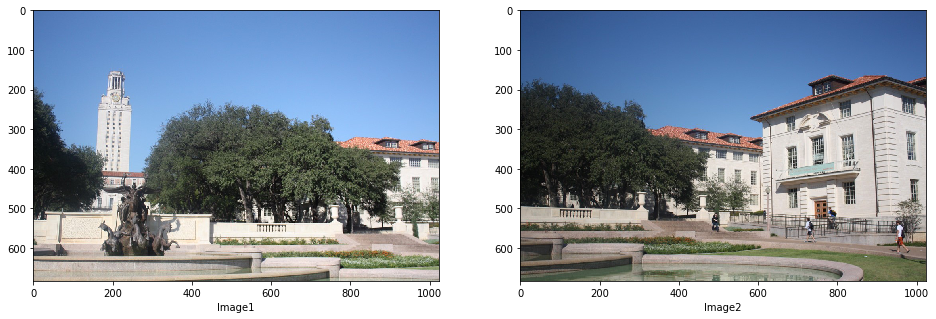

Extracting keypoints..


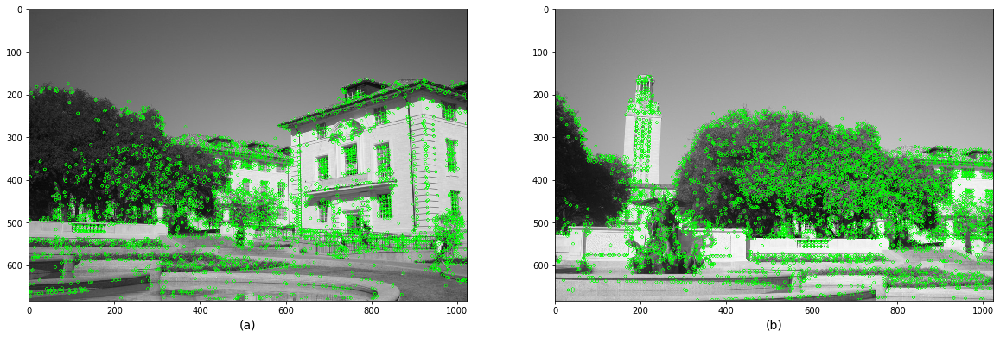

Getting corresponding points..
got  2633  matches by Brute Force.
Estimating the Homography Matrix using Ransac ...
Final inliers count:  2633
warpping images.. 
Building the final Panorama


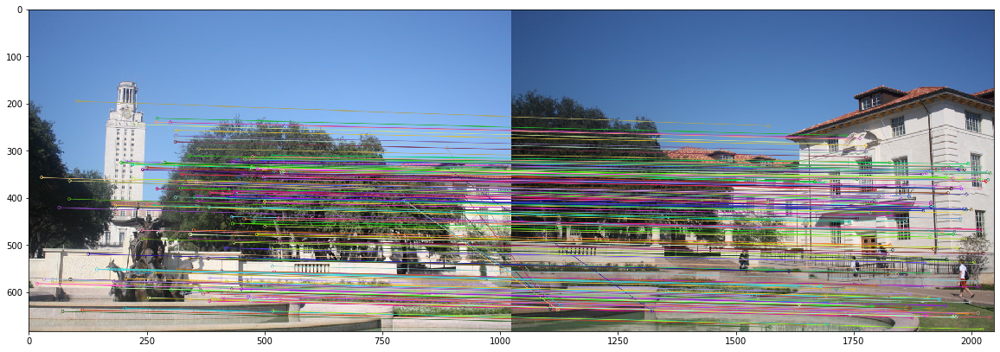

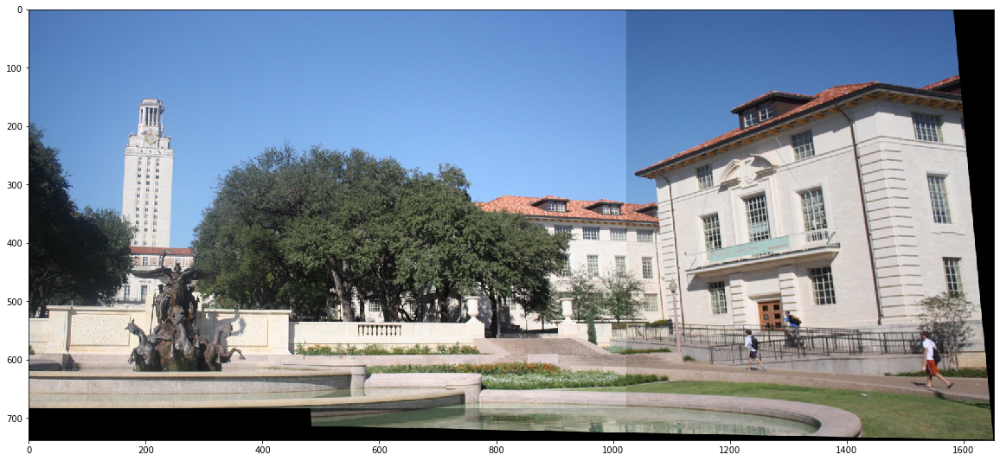

In [118]:
# Using Ordinary Ransac
img1_url = "http://www.ic.unicamp.br/~helio/imagens_registro/foto1A.jpg"
img2_url = "http://www.ic.unicamp.br/~helio/imagens_registro/foto1B.jpg"
stich_images(img2_url,img1_url,ransac = True)


# Example 3

Loading images


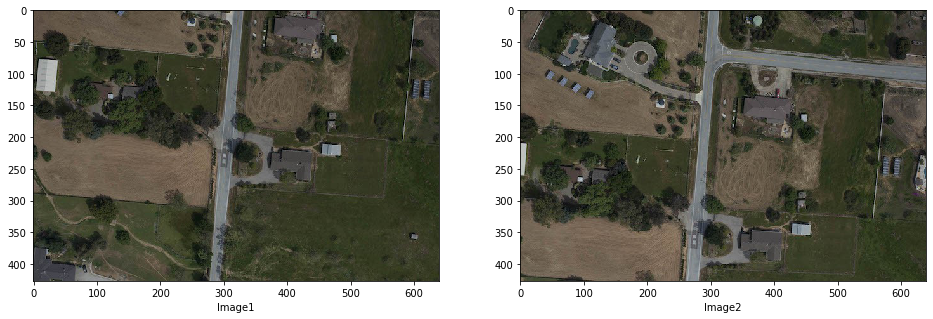

Extracting keypoints..


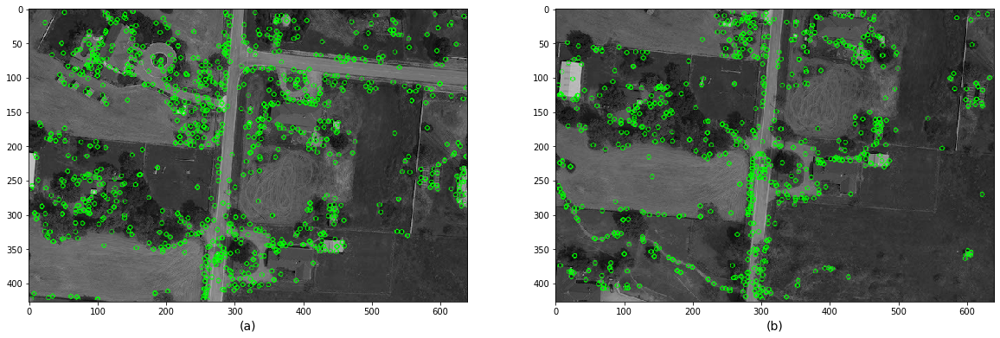

Getting corresponding points..
got  503  matches by Brute Force.
Estimating the Homography Matrix using Ransac ...
Ransac finished.
Corr size:  503 Max inliers:  289
Homography matrix has been estimated successfully.
Final inliers count:  289
warpping images.. 
Building the final Panorama


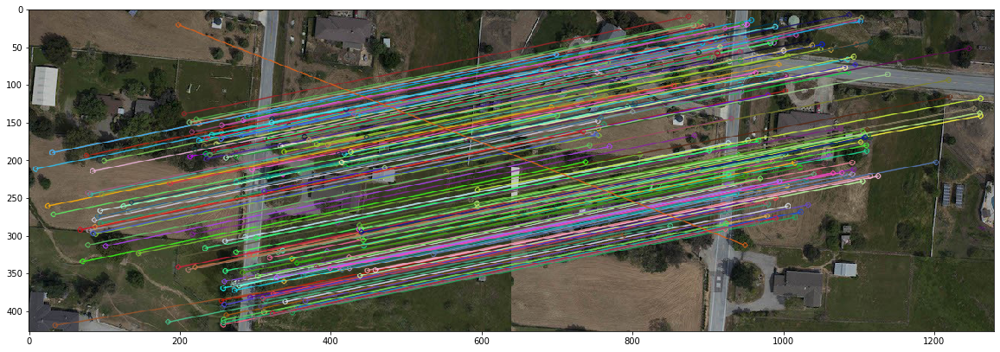

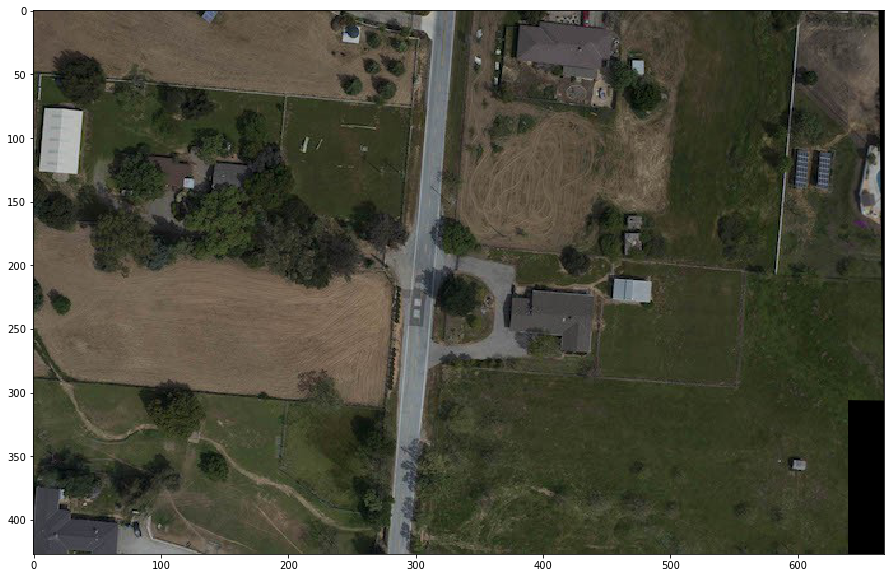

In [100]:
img1_url = "3.jpg"
img2_url = "4.jpg"
stich_images(img1_url,img2_url, ransac=False)


Loading images


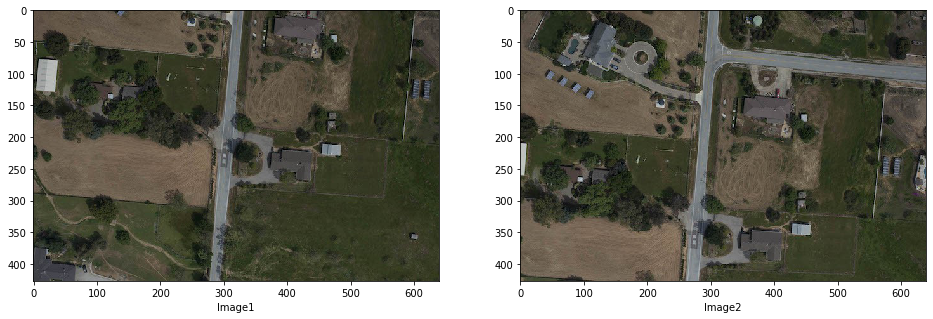

Extracting keypoints..


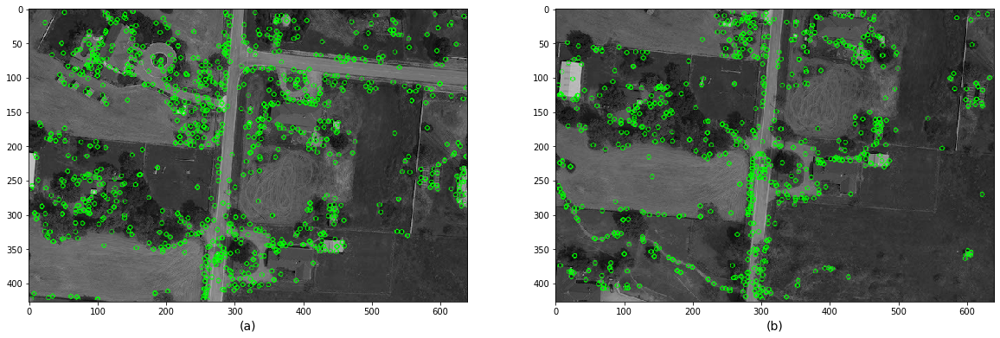

Getting corresponding points..
got  503  matches by Brute Force.
Estimating the Homography Matrix using Ransac ...
Final inliers count:  503
warpping images.. 
Building the final Panorama


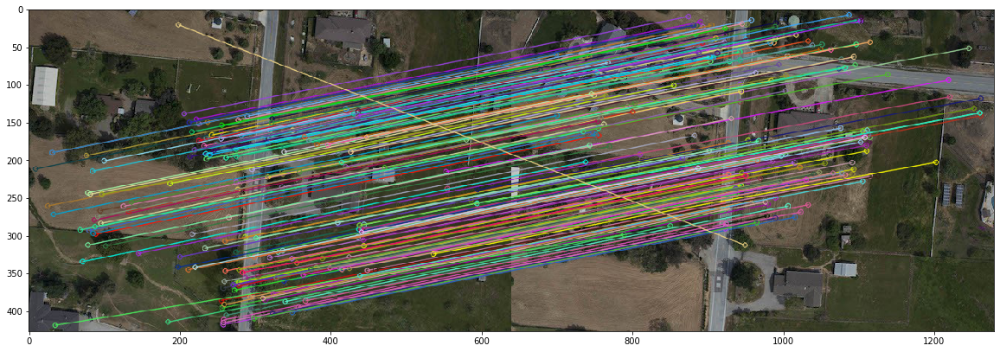

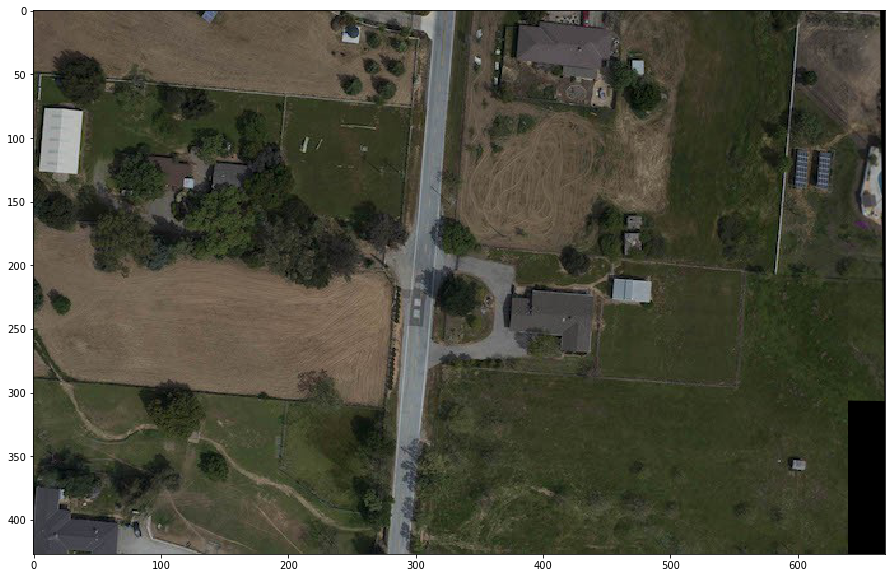

In [116]:
img1_url = "3.jpg"
img2_url = "4.jpg"
stich_images(img1_url,img2_url, ransac=True)
